In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [0]:
from shutil import copyfile
copyfile('drive/My Drive/Colab Notebooks/face_mask.zip','face_mask.zip' )
!unzip face_mask.zip > /dev/null
import os
os.remove("face_mask.zip")

# Install detectron2

In [3]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
     |████████████████████████████████| 276kB 4.3MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=804c69c3259c0b61aa5060ee29760a112b066cb48fcfb7df71aa35b5e34ca921
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-ak65rpdj
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-ak65rpdj
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-lin

In [4]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 2.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200612-cp36-none-any.whl size=41026 sha256=a45712837b7b19e8e2f2690002839a444a9965336b2f324cfa68b4cd09cdcbc8
  Stored in directory: /root/.cache/pip/wheels/2e/d1/2d/e8068900f03da2c84c32ac0d973b8bf73b2ffa9c3686771443
Successfully built fvcore


In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Run a pre-trained detectron2 model

We first download a random image from our dataset:

replace __MACOSX/face_mask/._.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


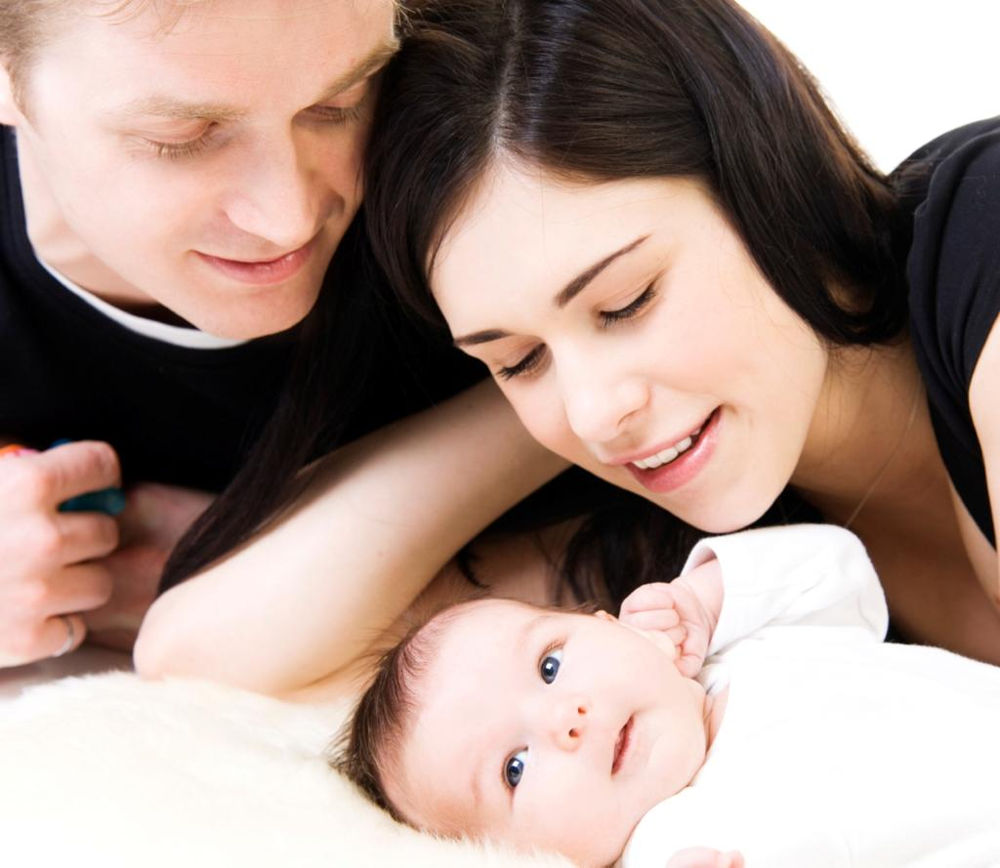

In [0]:
# !wget http://images.cocodataset.org/val2017/000000439715.jpg -O input.jpg
# download, decompress the data
# !wget https://cloud.tsinghua.edu.cn/f/4279772e0ea7499faa42/?dl=1
# !unzip index.html?dl=1 > /dev/null

im = cv2.imread("face_mask/train/19_Couple_Couple_19_173.jpg")
cv2_imshow(im)

In [0]:
!unzip face_mask.zip > /dev/null

replace __MACOSX/face_mask/._.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [0]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

In [0]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([0, 0, 0], device='cuda:0')
Boxes(tensor([[1.6154e+02, 8.7025e+00, 1.0046e+03, 8.6699e+02],
        [7.0212e-01, 3.8599e+00, 4.7239e+02, 6.5113e+02],
        [9.1350e+02, 1.2048e+02, 1.0219e+03, 5.8281e+02]], device='cuda:0'))


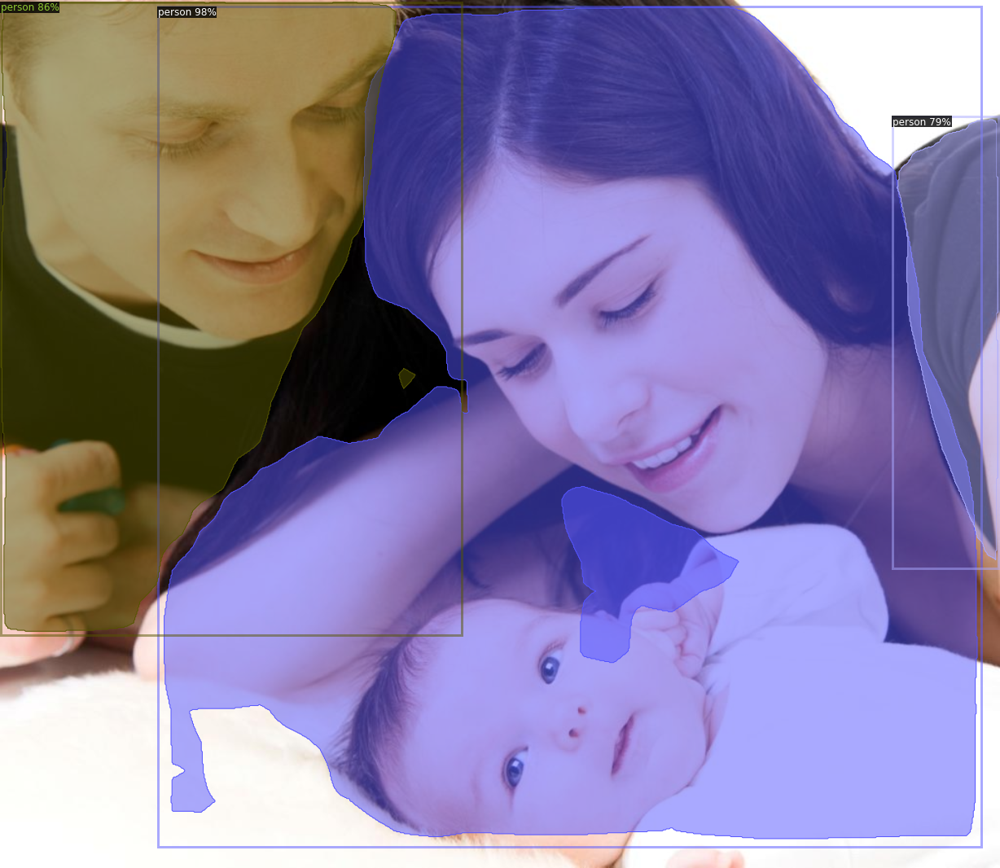

In [0]:
# We can use `Visualizer` to draw the predictions on the image.
# print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

In [0]:
# download, decompress the data
# !wget https://cloud.tsinghua.edu.cn/f/4279772e0ea7499faa42/?dl=1
# !unzip balloon_dataset.zip > /dev/null


Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [0]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("face_mask_train", {}, "train/train.json", "train")
# register_coco_instances("face_mask_val", {}, "val/output.json", "val")
# print(dataset_dicts)

import os
import numpy as np
import json
from detectron2.structures import BoxMode

def get_facemask_dict(img_dir,jsonName):
  json_file = os.path.join("face_mask",img_dir, jsonName)
  with open(json_file) as f:
    imgs_anns = json.load(f)

  dataset_dicts = []
  for idx, v in enumerate(imgs_anns['images']):
    record = {}
    filename = os.path.join("face_mask",img_dir, v['id'])
    height, width = cv2.imread(filename).shape[:2]

    record["file_name"] = filename
    record["image_id"] = idx
    record["height"] = height
    record["width"] = width
    objs = []
    for _, annos in enumerate(imgs_anns['annotations']):
      if annos['image_id'] == v['id']:
        data = annos['bbox']
        obj = {
        "bbox": data,
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": annos['segmentation'],
        "category_id": annos['category_id']-1,
        }
        objs.append(obj)
    record["annotations"] = objs
    dataset_dicts.append(record)
      
  return dataset_dicts

# from detectron2.data import DatasetCatalog, MetadataCatalog
# for d in ["train", "val"]:
#   print(d)
#   DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
#   MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
# balloon_metadata = MetadataCatalog.get("balloon_train")

In [0]:
# print(balloon_metadata)
from detectron2.data import DatasetCatalog, MetadataCatalog
DatasetCatalog._REGISTERED.clear()
for d in ["train", "val"]:
  DatasetCatalog.register("face_mask_" + d, lambda d=d: get_facemask_dict(d, d+".json"))
  MetadataCatalog.get("face_mask_" + d).set(thing_classes=["face","face_mask"])

In [0]:
face_mask_metadata = MetadataCatalog.get("face_mask_train")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:

> Indented block





In [0]:
# dataset_dicts = get_balloon_dicts("balloon/train")
train_dicts = get_facemask_dict("train","train.json")
test_dicts = get_facemask_dict("val","val.json")


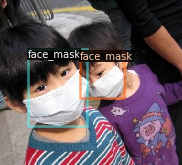

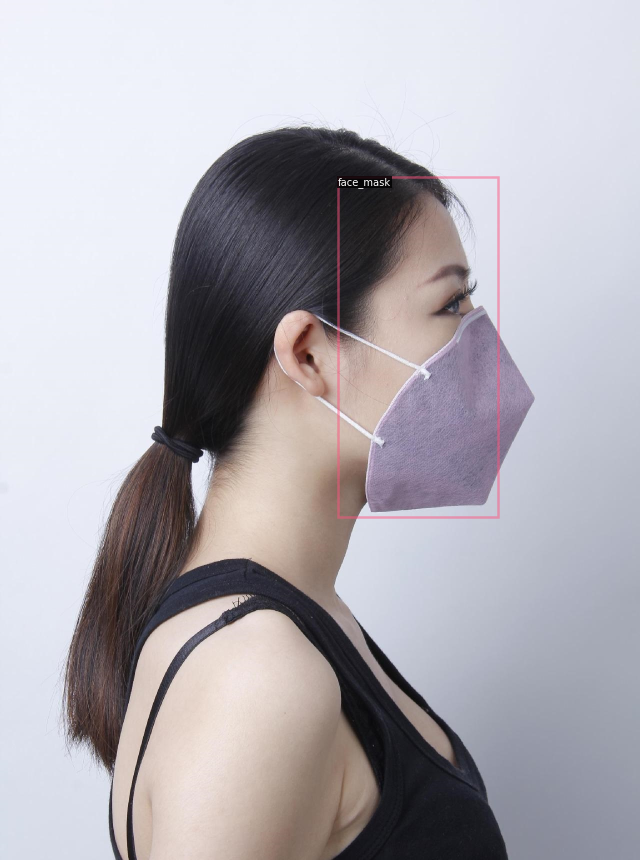

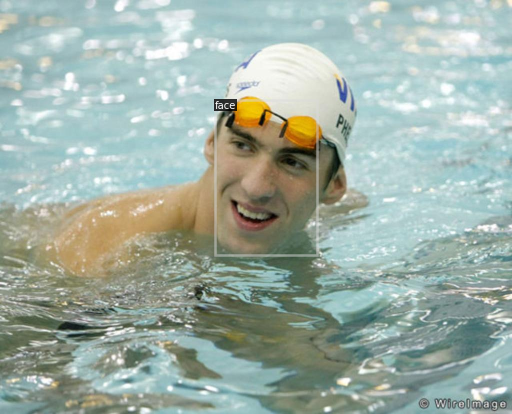

In [0]:
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=face_mask_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU. We will do it with a non-initialized model as spoken in the requirement


In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
cfg.clear()
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("face_mask_train",)
# cfg.DATASETS.TEST = ("face_mask_val",)
cfg.DATASETS.TEST = ()

In [0]:
cfg.DATALOADER.NUM_WORKERS = 2
# run with empty 
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.000025  # pick a good LR
# cfg.TEST.EVAL_PERIOD = 5
cfg.SOLVER.MAX_ITER = 10000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # two classes, which is face and face_mask

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[06/10 07:03:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [0]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1043), started 0:41:40 ago. (Use '!kill 1043' to kill it.)

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

import shutil
shutil.copyfile(os.path.join(cfg.OUTPUT_DIR, "model_final.pth"), 'drive/My Drive/Colab Notebooks/fastRCNN_final.pth') 
  
cfg.DATASETS.TEST = ("face_mask_val",)
predictor = DefaultPredictor(cfg)

In [0]:
# read model


# continue our work from last time
from detectron2.config import get_cfg

cfg.clear()
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = 'drive/My Drive/Colab Notebooks/fastRCNN_final.pth'
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # two classes, which is face and face_mask
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [0]:


cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("face_mask_val",)
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

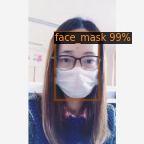

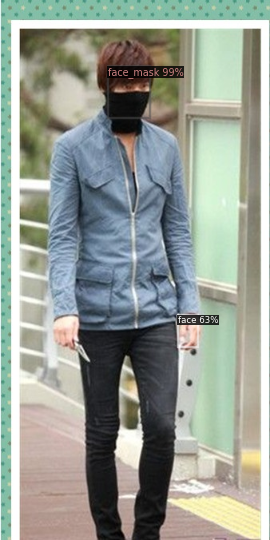

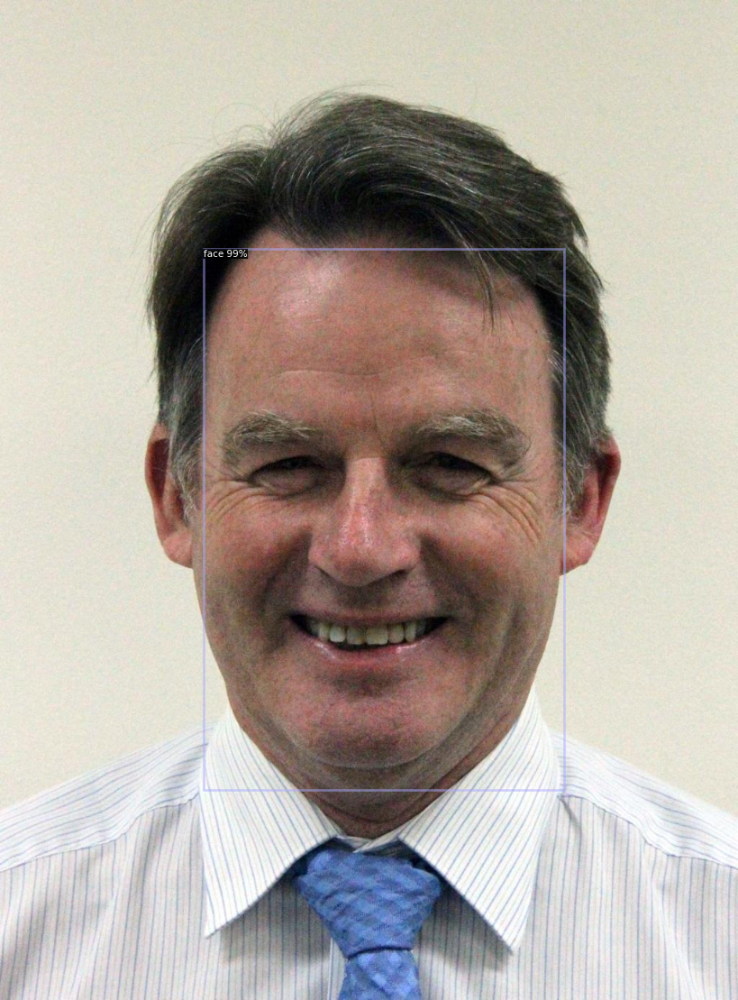

In [38]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(test_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=face_mask_metadata, 
                   scale=0.8, 
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

Let's do evaluation here.

In [0]:
copyfile('drive/My Drive/Colab Notebooks/groundtruth.zip','groundtruth.zip' )
!unzip 'groundtruth.zip'> /dev/null
os.remove("groundtruth.zip")

In [0]:
from torch import IntTensor
from torch import tensor
import tensorflow as tf
os.mkdir("detection")

In [0]:
# d = test_dicts[1]
for d in test_dicts:    
  im = cv2.imread(d["file_name"])
  outputs = predictor(im)
  v = outputs["instances"]
  write_path = 'detection/' + os.path.basename(d["file_name"]).split(".")[0]  + '.txt'
  with open(write_path, 'w') as the_file:
    for i in range(len(v.pred_classes)):
      # what is it?
      if IntTensor.item(v.pred_classes[i]) == 0:
        string = "Face"
      else:
        string = "Mask"
      # score?
      string = string + " " + str(IntTensor.item(v.scores[i]))
      string = string + " " + ' '.join(map(str, v.pred_boxes[i].tensor.cpu().numpy().squeeze()))
      # print(string)
      the_file.write(string +'\n')

In [0]:
import zipfile
def zipdir(path, ziph):
    # ziph is zipfile handle
    for root, dirs, files in os.walk(path):
        for file in files:
            ziph.write(os.path.join(root, file))

zipf = zipfile.ZipFile('detection_faster_RCNN_threshold70.zip', 'w', zipfile.ZIP_DEFLATED)
zipdir('detection', zipf)
zipf.close()

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70%. Not bad!

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("face_mask_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "face_mask_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [06/10 07:46:34 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'face_mask_val'. Trying to convert it to COCO format ...
[06/10 07:46:34 d2.data.datasets.coco]: Converting annotations of dataset 'face_mask_val' to COCO format ...)
[06/10 07:46:51 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[06/10 07:46:52 d2.data.datasets.coco]: Conversion finished, #images: 1839, #annotations: 3062
[06/10 07:46:52 d2.data.datasets.coco]: Caching COCO format annotations at './output/face_mask_val_coco_format.json' ...
[06/10 07:47:09 d2.data.common]: Serializing 1839 elements to byte tensors and concatenating them all ...
[06/10 07:47:09 d2.data.common]: Serialized dataset takes 0.46 MiB
[06/10 07:47:09 d2.evaluation.evaluator]: Start inference on 1839 images
[06/10 07:47:10 d2.evaluation.evaluator]: Inference done 11/1839. 0.0701 s / img. ETA=0:02:13
[06/10 07:47:15 d2.evaluation.evaluator]: Inference done 77/1839. 0.0729 s / img. ETA=0:02:1

OrderedDict([('bbox',
              {'AP': 55.237937196319734,
               'AP-face': 55.20507854209236,
               'AP-face_mask': 55.27079585054712,
               'AP50': 89.85684649428885,
               'AP75': 63.54294935105671,
               'APl': nan,
               'APm': nan,
               'APs': 61.84966166350754})])

# Other types of builtin models

In [0]:
# Inference with a keypoint detection model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(v.get_image()[:, :, ::-1])

# Run panoptic segmentation on a video

In [0]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [0]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!pip uninstall -y opencv-python opencv-contrib-python
!apt install python3-opencv  # the one pre-installed have some issues
!youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

In [0]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes)
# Using a model trained on COCO dataset
!git clone https://github.com/facebookresearch/detectron2
!python detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

In [0]:
# Download the results
from google.colab import files
files.download('video-output.mkv')